In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib as mpl
import molpx
from matplotlib import pylab as pyl
import numpy as np
import pyemma
# for visualization of molecular structures:
import nglview
import mdtraj
from threading import Timer
from nglview.player import TrajectoryPlayer
import deeptime as dt
from deeptime.clustering import KMeans
from deeptime.markov.msm import TRAMDataset, TRAM
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
from deeptime.plots import plot_implied_timescales
from deeptime.util.validation import implied_timescales
import fnmatch

In [2]:
files = ['/home/njm3/Desktop/069_MOR_emma_test.xtc', '/home/njm3/Desktop/p2_069_MOR_emma_test.xtc','/home/njm3/Desktop/p2_069_MOR_emma_test_no2.xtc']
pdb = '/home/njm3/Desktop/069_MOR_emma_test_short.pdb'
#with np.load(files) as fh:
#    data = fh['trajectory']
print(files)

['/home/njm3/Desktop/069_MOR_emma_test.xtc', '/home/njm3/Desktop/p2_069_MOR_emma_test.xtc', '/home/njm3/Desktop/p2_069_MOR_emma_test_no2.xtc']


In [3]:
device = torch.device("cuda")
torch.backends.cudnn.benchmark = True

torch.set_num_threads(8)

## Markov State Modeling

- Stochastic model of protein dynamics
- Model probabilities and rates of proteins changing states
    - States are points $\mathbf{x}(t) = \{p_{x_{1}},p_{y_{1}},p_{z_{1}},q_{x_{1}},q_{y_{1}},q_{z_{1}},\dots,p_{x_{N}},p_{y_{N}},p_{z_{N}},q_{x_{N}},q_{y_{N}},q_{z_{N}}\}$ or clusters of points (sets) in phase space $x(t)\in\Omega$
    - System has $6N$ degrees of freedom
    - Each particle has:
        - Time-dependent momentum $p(t)$ in $x$, $y$, $z$ directions
        - A position coordinate $q(x)$ in the $x$, $y$, $z$ directions at a time $t$
- Ensemble of receptor systems undergo time-dependent changes
    - $\Rightarrow$ Probability distribution $\rho(x,y;t)$ of possible ensemble states is time-dependent
- MSM creates network of kinetically interconnected states
    - Transition Path Theory gives flux between states
    



$$\mathbf{x}(t)=\begin{bmatrix} p_{x_{1}} \\ p_{y_{1}} \\ p_{z_{1}} \\ \vdots \\ q_{x_{N}} \\ q_{y_{N}} \\ q_{z_{N}}\end{bmatrix}$$

## Assumptions of MSMs

1. Process $x(t)$ is Markovian and time homogeneous for all points $x \in \Omega$ and times $t \in T$
    - This means that $\dfrac{d}{dt}x(t)$ depends only on the current state $x(t)$ and not on previous states of the system such as $x(t-\epsilon) \ \forall\epsilon \in \mathbb{R}^{+}$.
    - We make this assumption because our system has random motions induced by the thermal bath surrounding it, meaning the history of the system essentially gets erased by the thermal fluctuations. 
    - transition probability density $\rho (\mathbf{x},\mathbf{y}|\tau)$ for $\mathbf{x},\mathbf{y} \in \Omega$ and $\tau \in \mathbb{R}_{0+}$:
    \begin{equation}
    \rho (\mathbf{x},A|\tau)= \mathbb{P}[\mathbf{x}(t+\tau)\in A|\mathbf{x}(x)=\mathbf{x}]=\int_{A} \rho (\mathbf{x},\mathbf{y}|\tau)d\mathbf{y}.
    \end{equation}
3. $\mathbf{x}(t)$ ergodic
    \begin{equation*}
        \lim_{T\to\infty}\dfrac{1}{T}\int_{0}^{T}f(\mathbf{x}(t))\mathrm{d}t = \int_{\Omega} f(\mathbf{x})\mu(\mathbf{x})\mathrm{d}\mathbf{x}.
    \end{equation*}
    - $\mathbf{x}(t)$ is irreducible, aperiodic, and positive recurrent
    - no dynamically disconnected regions of phase space $\Omega$ (all states communicate)
    - each state $\mathbf{x}$ will be visited infinitely often as $t \to \infty$
    - We make this assumption because of the ergodic hypothesis in statistical thermodynamics, which states that the amount of time a system stays in some region $A\subseteq\Omega$ is equal to the volume of A.
    - $\Longrightarrow$ the system has a unique invariant measure $\mu : \Omega \to \mathbb{R}_{0}^{+}$ This measure corresponds to a stationary PDF, namely the Gibbs measure, which is defined as:
    \begin{equation}
    \mu (\mathbf{x})=\dfrac{e^{-\beta \mathbf{H}(\mathbf{x})}}{Z(\beta)}
    \end{equation}
    - $\mathbf{H}(\mathbf{x})$ is the Hamiltonian of the system, $\beta=1/k_{B}T$ where $k_{B}$ is the Boltzmann coefficient and $T$ is the temperature (making $k_{B}T$ the thermal energy), and $Z(\beta)$ is the partition function, which is defined as
    \begin{equation}
    Z(\beta)=\int_{\Omega}e^{-\beta \mathbf{H}(\mathbf{x})}d\mathbf{x}.
    \end{equation}

4. $\mathbf{x}(t)$ is *reversible* and obeys detained balance
    \begin{equation}
    \mu (\mathbf{x}) \rho(\mathbf{x},\mathbf{y}|\tau)= \mu (\mathbf{y}) \rho(\mathbf{y},\mathbf{x}|\tau).
    \end{equation}
    - fraction of systems transitioning in each direction during time $\tau$ is equal

This means that at equilibrium, the probability of a system (out of an ensemble) transitioning from $\mathbf{x}$ to $\mathbf{y}$ in time $\tau$ is the same as the probability of transitioning from $\mathbf{y}$ to $\mathbf{x}$ in the same time period; in other words, the fraction of systems transitioning in each direction during time $\tau$ should be equal. The justification for this assumption is essentially one by contradiction; if this were not true, then there would exist a set of states where transitioning between them in one direction has a greater probability than the reverse transition. This would imply that a process could use this directionality to produce work, but since the system is at equilibrium, this would contradict the second law of thermodynamics.


## Transfer Operators and Spectral Theory
From our construction of individual trajectories $\mathbf{x}(t)$, we seek to examine the distributions and time-evolution of ensembles of these trajectories. Consider an ensemble of identical systems at some time $t$ distributed in phase space $\Omega$ according to the PDF $\rho_{t}(\mathbf{x})$. It is important to note that the PDF $\rho_{t}(\mathbf{x})$ is different than $\mu (\mathbf{x})$, since the former is a distribution that can vary with time (hence the index $t$) while the latter is the stationary distribution, which for a system at equilibrium does not change over time. Because each system in the ensemble undergoes interstate transitions according to the distribution $\rho (\mathbf{x},\mathbf{y},\tau)$ in some time period $\tau$, the PDF of the ensemble will have changed after that time period to reflect this. Three closely related operators describe the transition from an ensemble's PDF from $\rho_{t}(\mathbf{x})$ initially to $\rho_{t+\tau}(\mathbf{x})$ after time period $\tau$. The first operator of interest is the propagator $\Gamma (\tau)$ which is defined as:
\begin{equation}
\Gamma (\tau) \circ \rho_{t}(\mathbf{x})= \rho_{t+\tau}(\mathbf{x})=\int_{\Omega}\rho_{t}(\mathbf{x}) \rho (\mathbf{x},\mathbf{y},\tau) d \mathbf{x}.
\end{equation}
The propagator is clearly an operator since it takes an initial probability density $\rho_{t}(\mathbf{x})$ and maps it to the probability distribution of the ensemble after time $\tau$, $\rho_{t+\tau}(\mathbf{x})$. This latter distribution will be more similar to the stationary distribution than the initial one since as $t \to \infty$, the PDFs will converge in distribution to $\mu (\mathbf{x})$.

The second operator of interest is the transfer operator (also known as the Ruelle-Perron-Frobenius operator) $\mathcal{T}(\tau)$, which is defined as:
\begin{equation}
\mathcal{T} (\tau) \circ u_{t}(\mathbf{x})= u_{t+\tau}(\mathbf{x})=\dfrac{1}{\mu (\mathbf{y})} \int_{\Omega} u_{t}(\mathbf{x}) \rho (\mathbf{x},\mathbf{y},\tau) \mu (\mathbf{x}) d \mathbf{x}.
\end{equation}
The functions $u_{t}(\mathbf{x})$ that are propagated by $\mathcal{T} (\tau)$ are not probability distributions, instead they are related to the probability distribution $\rho_{t}(\mathbf{x})$ by the factor $\mu (\mathbf{x})$, the stationary distribution. In other words,
\begin{equation}
\rho_{t}(\mathbf{x})=\mu (\mathbf{x})u_{t}(\mathbf{x}).
\end{equation}

These operators specifically act on the Hilbert space, $\mathbb{L}^{2}$; specifically:
\begin{equation}
    \mathbb{L}^{2}=\Big\{f:\Omega\to\mathbb{C} \ \Big| \  ||f||_{2}^{2}=\int_{\Omega}|f(\mathbf{x})|^{2}\mathrm{d}\mathbf{x}<\infty\Big\}
\end{equation}
and
\begin{equation}
    \mathbb{L}_{\mu}^{2}=\Big\{f:\Omega\to\mathbb{C} \ \Big| \  ||f||_{2,\mu}^{2}=\int_{\Omega}|f(\mathbf{x})|^{2}\mu(\mathbf{x})\mathrm{d}\mathbf{x}<\infty\Big\},
\end{equation}
which are equipped with the inner products
\begin{equation}
    \langle a,b\rangle=\int_{\Omega}a(\mathbf{x})^{*}b(\mathbf{x})\mathrm{d}\mathbf{x}
\end{equation}
and
\begin{equation}
    \langle a,b\rangle_{\mu}=\int_{\Omega}a(\mathbf{x})^{*}b(\mathbf{x})\mu(\mathbf{x})\mathrm{d}\mathbf{x}
\end{equation}
respectively.

The operators $\Gamma (\tau)$ and $\mathcal{T}(\tau)$ can be shown to have the following properties:
1. The operators $\Gamma (\tau)$ and $\mathcal{T}(\tau)$ satisfy the Chapman-Kolmogorov equation, meaning
    \begin{equation}
    \rho_{t+k\tau}(\mathbf{x})=[\Gamma (\tau)]^{k} \circ \rho_{t}(\mathbf{x}) 
    \end{equation}
    \begin{equation}
    u_{t+k\tau}(\mathbf{x})=[\mathcal{T} (\tau)]^{k} \circ u_{t}(\mathbf{x})
    \end{equation}
    where $[\mathcal{T} (\tau)]^{k}$ refers to the k-fold composition of operator with $u_{t}(\mathbf{x})$, so essentially $\mathcal{T}(\tau_{k}) \circ \dots \circ \mathcal{T}(\tau_{1}) \circ u_{t}(\mathbf{x})   $. This means these operators can be used to propagate the dynamics over arbitrary time scales. 

2. The operators $\Gamma (\tau)$ and $\mathcal{T}(\tau)$ have eigenfunctions $\phi_{i}(\mathbf{x})$ and $\psi_{i}(\mathbf{x})$ respectively, both with the associated eigenvalues $\lambda_{i}$. This means:
    \begin{equation}
    \Gamma(\tau) \circ  \phi_{i}(\mathbf{x}) = \lambda_{i} \phi_{i}(\mathbf{x}),
    \end{equation}
    \begin{equation}
    \mathcal{T}(\tau) \circ  \psi_{i}(\mathbf{x}) = \lambda_{i} \psi_{i}(\mathbf{x}).
    \end{equation}

3. Because the dynamics of our ensemble obey detailed balance (i.e. are reversible), this implies that the operators $\Gamma (\tau)$ and $\mathcal{T}(\tau)$ are adjoint. We will demonstrate this for one case, but it is easy to show it is true for both.

    Consider $\Gamma (\tau)$ acting on the function $\rho_{t}(\mathbf{x})$, 
    \begin{equation}
    \Gamma (\tau) \circ \rho_{t}(\mathbf{x}) =\int_{\Omega}\rho_{t}(\mathbf{x}) \rho (\mathbf{x},\mathbf{y},\tau) d \mathbf{x}.
    \end{equation}
    as well as $\Gamma (\tau)$ acting on the function $\rho_{t}(\mathbf{y})$
    \begin{equation}
    \Gamma (\tau) \circ \rho_{t}(\mathbf{y}) =\int_{\Omega}\rho_{t}(\mathbf{y}) \rho (\mathbf{x},\mathbf{y},\tau) d \mathbf{x}.
    \end{equation}
    We want to show that $\langle\,\Gamma (\tau)\rho_{t}(\mathbf{x}),\rho_{t}(\mathbf{y}) \rangle = \langle\,\rho_{t}(\mathbf{x}), \Gamma (\tau)\rho_{t}(\mathbf{y}) \rangle $. Since $\langle f(x),g(x)\rangle$    is defined as
    \begin{equation}
    \langle f(x),g(x)\rangle=\int f(x)g(x)dx
    \end{equation} 
    we get
    \begin{equation}
    \langle\,\Gamma (\tau)\rho_{t}(\mathbf{x}),\rho_{t}(\mathbf{y}) \rangle = \int \int_{\Omega}\rho_{t}(\mathbf{x}) \rho (\mathbf{x},\mathbf{y},\tau) d \mathbf{x}  \ \rho_{t}(\mathbf{y}) d \mathbf{y},
    \end{equation}
    \begin{equation}
     \langle\,\rho_{t}(\mathbf{x}), \Gamma (\tau)\rho_{t}(\mathbf{y}) \rangle = \int \int_{\Omega}\rho_{t}(\mathbf{y}) \rho (\mathbf{y},\mathbf{x},\tau) d \mathbf{y}  \ \rho_{t}(\mathbf{x}) d \mathbf{x}.
    \end{equation}
    We can rearrange the above to 
    \begin{equation}
     * \  \langle\,\Gamma (\tau)\rho_{t}(\mathbf{x}),\rho_{t}(\mathbf{y}) \rangle = \int \int_{\Omega}\rho_{t}(\mathbf{x}) \rho_{t}(\mathbf{y}) \rho (\mathbf{x},\mathbf{y},\tau) d \mathbf{x} d \mathbf{y},
    \end{equation} 
    \begin{equation}
    \langle\,\rho_{t}(\mathbf{x}), \Gamma (\tau)\rho_{t}(\mathbf{y}) \rangle = \int \int_{\Omega}\rho_{t}(\mathbf{x})  \rho_{t}(\mathbf{y}) \rho (\mathbf{y},\mathbf{x},\tau) d \mathbf{x} d \mathbf{y}.
    \end{equation}
    Because our system obeys detailed balance, 
    \begin{equation}
    \mu (\mathbf{x}) \rho(\mathbf{x},\mathbf{y},\tau)= \mu (\mathbf{y}) \rho(\mathbf{y},\mathbf{x},\tau).
    \end{equation}
    Since our system is absolutely continuous with respect to the invariant measure $\mu (\mathbf{x})$, the above becomes
    \begin{equation}
    \rho(\mathbf{x},\mathbf{y},\tau)=\rho(\mathbf{y},\mathbf{x},\tau).
    \end{equation}
    Applying this, we get
    \begin{equation}
     \langle\,\rho_{t}(\mathbf{x}), \Gamma (\tau)\rho_{t}(\mathbf{y}) \rangle = \int \int_{\Omega}\rho_{t}(\mathbf{x})  \rho_{t}(\mathbf{y}) \rho (\mathbf{x},\mathbf{y},\tau) d \mathbf{x} d \mathbf{y},
    \end{equation}
    which is equivalent to (eqn. \*), and thus concludes the proof.

4. Because the integrands in the definitions of the operators $\Gamma (\tau)$ and $\mathcal{T}(\tau)$ are probabilities, they are real numbers, making them equal to their complex conjugate (since their imaginary part is 0). This makes $\Gamma (\tau)$ and $\mathcal{T}(\tau)$ equal to $\Gamma^{*} (\tau)$ and $\mathcal{T}^{*}(\tau)$, their complex conjugates, making both operators self-adjoint. By definition, this implies that both operators are also normal, since clearly $\mathcal{T}^{*}\mathcal{T}=\mathcal{T}\mathcal{T}^{*}$. Based on theorem 10.57 from Axler's \textit{Measure, Integration \& Real Analysis}\footnote{Axler S. Measure, Integration \& Real Analysis. Springer; 2020.}, since $\Gamma^{*} (\tau)$ and $\mathcal{T}^{*}(\tau)$ are normal, their eigenfunctions corresponding to distinct eigenvalues are orthogonal. Furthermore, the above means that the spectrum of $\Gamma^{*} (\tau)$ and $\mathcal{T}^{*}(\tau)$, are $\mathrm{sp}(\Gamma), \mathrm{sp}\mathcal{T} \subset \mathbb{R}$. It has been previously shown that the the eigenvalues $\lambda_{i}\in(-1,1]$, that for the corresponding eigenfunctions, $\langle \phi_{i}(\mathbf{x}),\psi_{i}(\mathbf{x})\rangle$, and the eigenfunctions are related by $\phi_{i}(\mathbf{x})=\mu(\mathbf{x})\psi_{i}(\mathbf{x})$.

5. Because $\Gamma^{*} (\tau)$ and $\mathcal{T}^{*}(\tau)$ are continuous, $\mathrm{sp}(\Gamma), \mathrm{sp}(\mathcal{T})$ are as well. We say an eigenvalue $\lambda_{i}\in\mathrm{sp}(\Gamma)$ is isolated if for some $\exists\epsilon>0$ such that $N_{\epsilon}(\lambda_{i})\cap\mathrm{sp}(\Gamma)=\lambda_{i}$, where $N_{\epsilon}(\lambda_{i})$ denotes the $\epsilon$-neighborhood of the eigenvalue. The set of all isolated eigenvalues with finite multiplicity is called the discrete spectrum. The spectrum of our operators has an essential spectrum $\sigma_{ess}$, which is continuous, and a discrete spectrum $\sigma_{discr}$, as defined above. The essential spectral radius is $r=\min\Big\{r\in[0,1)  \Big| \forall \lambda_{i}\in\sigma_{ess}, |\lambda_{i}|<r  \Big\}$. We will consider $m$ elements of $\sigma_{discr}$ sorted such that $\lambda_{1}=1>\lambda_{2}\geq\dots\geq\lambda_{m}$ where $r<|\lambda_{m}|$, and assume that $\lambda_{1}$ is simple. The largest eigenvalue corresponds to the stationary distribution such that
    \begin{equation}
        \Gamma(\tau)\circ\mu(\mathbf{x})=\mu(\mathbf{x})=\psi_{1}(\mathbf{x}).
    \end{equation}

We can decompose the dynamical system into a superposition of $m$ slow processes and the remaining fast processes. Considering $\mathcal{T}$, the spectral theorem for self-adjoint compact operators allows us to get:
\begin{equation}
    u_{t+k\tau}(\mathbf{x})=\mathcal{T}_{slow}(k\tau)\circ u_{t}(\mathbf{x})+\mathcal{T}_{fast}(k\tau)\circ u_{t}(\mathbf{x})
\end{equation}
\begin{equation}
    =\sum_{i=1}^{m}\lambda_{i}^{k}\langle u_{i},\phi_{i}\rangle\psi_{i}(\mathbf{x})+\mathcal{T}_{fast}(k\tau)\circ u_{t}(\mathbf{x})
\end{equation}
\begin{equation}
    =\sum_{i=1}^{m}\lambda_{i}^{k}\langle u_{i},\psi_{i}\rangle_{\mu}\psi_{i}(\mathbf{x})+\mathcal{T}_{fast}(k\tau)\circ u_{t}(\mathbf{x})
\end{equation}
We separate the dynamics like this because the fast dynamics often are quicker than those we are interested in. For instance, the outward motion of the lower parts of a GPCR's transmembrane helices after drug binding can occur on a timescale ranging from microseconds to seconds, and drug unbinding processes can happen on the timescale of hours; these are the types of dynamics we are interested in, and not the much faster dynamics such as the slight rotations around a single bond of one amino acid side chain in the receptor occurring on a pico- to nanosecond time scale. Since $\forall i, \lambda_{i}\in[-1,1]$ then for $|\lambda_{i}|<1, \ |\lambda_{i}^{k}|<|\lambda_{i}|$ for $k>1$. This means that as $k\to\infty$, the only term that won't vanish is $\lambda_{1}=1$, meaning that the distribution will be the stationary distribution $\phi_{1}=\mu(\mathbf{x})$. This also demonstrates that processes corresponding to eigenvalues close to 1 will decay the slowest. The physical timescale that these decays occur over can be called the i$^{th}$ implied timescale, and written as 
\begin{equation}
    t_{i}=-\dfrac{\tau}{\ln(\lambda_{i})},
\end{equation}
 and each i corresponds to a different timescale. We can rewrite our superposition of dynamics as
 \begin{equation}
    u_{t+k\tau}(\mathbf{x})=1+\sum_{i=2}^{m}e^{\dfrac{-k\tau}{t_{i}}}\langle u_{i},\psi_{i}\rangle_{\mu}\psi_{i}(\mathbf{x})+\mathcal{T}_{fast}(k\tau)\circ u_{t}(\mathbf{x}).
\end{equation}

### Summary
- Model acts on column vectors scaled by the equilibrium Boltzman distribution
$$u_{t}(\mathbf{x}(t))=\mu(\mathbf{x})\begin{bmatrix} \rho(p_{x_{1}}) \\ \rho(p_{y_{1}}) \\ \rho(p_{z_{1}}) \\ \vdots \\ \rho(q_{x_{N}}) \\ \rho(q_{y_{N}}) \\ \rho(q_{z_{N}})\end{bmatrix}$$
- MSM utilizes spectral properties of Ruelle-Perron-Frobenius (Transfer) operator
\begin{equation}
\mathcal{T} (\tau) \circ u_{t}(\mathbf{x})= u_{t+\tau}(\mathbf{x})=\dfrac{1}{\mu (\mathbf{y})} \int_{\Omega} u_{t}(\mathbf{x}) \rho (\mathbf{x},\mathbf{y},\tau) \mu (\mathbf{x}) d \mathbf{x}.
\end{equation}
- Operator describes time-dependent changes in state occupancy in the protein ensemble
- Change in PDF $\rho$ after lag time $\tau$
- Transfer matrix is a discretization of the transition operator, so
$$\mathbf{T}(\tau)=\frac{1}{\mu(\mathbf{y})}\begin{bmatrix}\langle x_{1},x_{1}\rangle_{\mu} &\dots&\langle x_{1},x_{N}\rangle_{\mu} \\ \vdots & \ddots & \vdots \\
        \langle x_{N},x_{1}\rangle_{\mu} & \dots & \langle x_{N},x_{N}\rangle_{\mu}\end{bmatrix}$$


- Decompose operator into eigenfunctions with specific system dynamics
    - Eigenvalue equation: 
    \begin{equation}
    \mathcal{T}(\tau) \circ  \psi_{i}(\mathbf{x}) = \lambda_{i} \psi_{i}(\mathbf{x})
    \end{equation}
- First eigenvalue is 1
    - Slowest dynamics (Steady-State/equilibrium dynamics)
    - Described by equilibrium distribution
    \begin{equation}\mu (\mathbf{x})=\dfrac{e^{-\beta \mathbf{H}(\mathbf{x})}}{Z(\beta)}, \ \ Z(\beta)=\int_{\Omega}e^{-\beta \mathbf{H}(\mathbf{x})}d\mathbf{x}\end{equation}
- Smaller eigenvalues equal faster motions

- Spectrum of $\mathcal(T)(\tau)$ splits into two parts
\begin{equation}
u_{t+k\tau}(\mathbf{x})=\mathcal{T}_{slow}(k\tau)\circ u_{t}(\mathbf{x})+\mathcal{T}_{fast}(k\tau)\circ u_{t}(\mathbf{x})
\end{equation}
- Discrete
    - Motions slow enough to be relevant
    - Broad motions of helices or drugs in binding pocket
    - First eigenvalue is **always** 1 in a properly constructed system
- Continuous
    - Motions too fast to be relevant
    - Rotameric state changes
- Eigenvalues $\lambda_{i}$ describe timescales of motion
\begin{equation}
u_{t+k\tau}(\mathbf{x})=1+\sum_{i=2}^{m}e^{\dfrac{-k\tau}{t_{i}}}\langle u_{i},\psi_{i}\rangle_{\mu}\psi_{i}(\mathbf{x})+\mathcal{T}_{fast}(k\tau)\circ u_{t}(\mathbf{x})
\end{equation}

In [4]:
train_files = files
test_file = files  
UNK = []
for i in range(4778,4845):
    UNK.append(i)
UNK = np.array(UNK)
feat2 = pyemma.coordinates.featurizer(pdb)
feat2.add_backbone_torsions(cossin=True, deg=True, periodic=True)
feat2.add_sidechain_torsions(which='all', cossin=True, deg=True, periodic=True)
data_torsions = pyemma.coordinates.load(train_files, features=feat2)
feat3 = pyemma.coordinates.featurizer(pdb)
hv1 = feat3.select_Heavy()
feat3.add_selection(hv1)
data_heavy = pyemma.coordinates.load(train_files, features=feat3)
heavy_cat = np.concatenate(data_heavy)
heavy = np.array(heavy_cat)
# print(heavy)

/home/njm3/anaconda3/lib/python3.8/site-packages/pyemma/coordinates/data/featurization/angles.py:211: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  indices = np.vstack(valid.values())


Obtaining file info:   0%|                                | 0/3 [00:00<?, ?it/s]

getting output of FeatureReader:   0%|                    | 0/6 [00:00<?, ?it/s]

Obtaining file info:   0%|                                | 0/3 [00:00<?, ?it/s]

getting output of FeatureReader:   0%|                   | 0/18 [00:00<?, ?it/s]

In [5]:
test = np.array(feat3.describe())
test2 = feat3.describe()
print(test)
indices = [i for i, s in enumerate(test) if 'UNK 347' in s]
print(indices)

    

['ATOM:GLY 52 CAY 0 x' 'ATOM:GLY 52 CAY 0 y' 'ATOM:GLY 52 CAY 0 z' ...
 'ATOM:UNK 347 C26 4809 x' 'ATOM:UNK 347 C26 4809 y'
 'ATOM:UNK 347 C26 4809 z']
[7035, 7036, 7037, 7038, 7039, 7040, 7041, 7042, 7043, 7044, 7045, 7046, 7047, 7048, 7049, 7050, 7051, 7052, 7053, 7054, 7055, 7056, 7057, 7058, 7059, 7060, 7061, 7062, 7063, 7064, 7065, 7066, 7067, 7068, 7069, 7070, 7071, 7072, 7073, 7074, 7075, 7076, 7077, 7078, 7079, 7080, 7081, 7082, 7083, 7084, 7085, 7086, 7087, 7088, 7089, 7090, 7091, 7092, 7093, 7094, 7095, 7096, 7097, 7098, 7099, 7100, 7101, 7102, 7103, 7104, 7105, 7106, 7107, 7108, 7109, 7110, 7111, 7112, 7113, 7114, 7115, 7116, 7117, 7118, 7119, 7120, 7121, 7122, 7123, 7124, 7125, 7126, 7127, 7128, 7129, 7130, 7131, 7132, 7133]


In [6]:
print(len(test))

7134


In [7]:
import re
# resid_dict = {}
# r = re.compile('(?<=:)(\w+\s\d+)')
# newlist = list(filter(r.search, test2)) # Read Note below
newlist = []
for string in test2:
    match = re.search('(?<=:)(\w+\s\d+)',string)
    newlist.append(match[0])
# print(newlist)

res = []
for i in newlist:
    if i not in res:
        res.append(i)
print(res)
# resid_dict = dict.fromkeys(newlist, [])
# print(resid_dict)

['GLY 52', 'SER 53', 'HIS 54', 'SER 55', 'LEU 56', 'PRO 58', 'GLN 59', 'THR 60', 'GLY 61', 'SER 62', 'PRO 63', 'SER 64', 'MET 65', 'VAL 66', 'THR 67', 'ALA 68', 'ILE 69', 'THR 70', 'ILE 71', 'MET 72', 'ALA 73', 'LEU 74', 'TYR 75', 'SER 76', 'ILE 77', 'VAL 78', 'CYS 79', 'VAL 80', 'VAL 81', 'GLY 82', 'LEU 83', 'PHE 84', 'GLY 85', 'ASN 86', 'PHE 87', 'LEU 88', 'VAL 89', 'MET 90', 'TYR 91', 'VAL 92', 'ILE 93', 'VAL 94', 'ARG 95', 'TYR 96', 'THR 97', 'LYS 98', 'MET 99', 'LYS 100', 'THR 101', 'ALA 102', 'THR 103', 'ASN 104', 'ILE 105', 'TYR 106', 'ILE 107', 'PHE 108', 'ASN 109', 'LEU 110', 'ALA 111', 'LEU 112', 'ALA 113', 'ASP 114', 'ALA 115', 'LEU 116', 'ALA 117', 'THR 118', 'SER 119', 'THR 120', 'LEU 121', 'PRO 122', 'PHE 123', 'GLN 124', 'SER 125', 'VAL 126', 'ASN 127', 'TYR 128', 'LEU 129', 'MET 130', 'GLY 131', 'THR 132', 'TRP 133', 'PRO 134', 'PHE 135', 'GLY 136', 'ASN 137', 'ILE 138', 'LEU 139', 'CYS 140', 'LYS 141', 'ILE 142', 'VAL 143', 'ILE 144', 'SER 145', 'ILE 146', 'ASP 147', '

In [59]:
print(res[0])

GLY 52


In [8]:
val_dict = []
for i in range(0,len(res)):
    indices = [j for j, s in enumerate(test) if res[i] in s]
    val_dict.append(indices)
    # print(key)
    # print(indices)
    # resid_dict[key].append(indices)
# print(val_dict)

In [9]:
residict = dict(zip(res, val_dict))
print(residict["HIS 297"])

[5805, 5806, 5807, 5808, 5809, 5810, 5811, 5812, 5813, 5814, 5815, 5816, 5817, 5818, 5819, 5820, 5821, 5822, 5823, 5824, 5825, 5826, 5827, 5828, 5829, 5830, 5831, 5832, 5833, 5834]


In [85]:
estimator2 = dt.covariance.Covariance(lagtime=0, remove_data_mean=True, compute_c00=True)
cov2 = estimator2.fit(heavy).fetch_model()
cov_mat = np.array(cov2.cov_00)
print(cov_mat)

[[0.35492065 0.12578315 1.01684435 ... 0.38889052 0.33153256 0.64690195]
 [0.12578315 0.25185641 0.38557595 ... 0.10697432 0.14887154 0.18490516]
 [1.01684435 0.38557595 4.53793197 ... 1.71422449 1.45055605 2.93233137]
 ...
 [0.38889052 0.10697432 1.71422449 ... 0.72086234 0.57368915 1.18128962]
 [0.33153256 0.14887154 1.45055605 ... 0.57368915 0.54974834 0.97007173]
 [0.64690195 0.18490516 2.93233137 ... 1.18128962 0.97007173 2.06229369]]


In [11]:
print(cov2.cov_00[0])
print(cov2.cov_00[1])

[0.35492065 0.12578315 1.01684435 ... 0.38889052 0.33153256 0.64690195]
[0.12578315 0.25185641 0.38557595 ... 0.10697432 0.14887154 0.18490516]


In [87]:
# test1 = heavy[:,0]
# test2 = heavy[:,1]
# E1 = np.average(test1)
# E2 = np.average(test2)
# E12 = np.average(test1*test2)
# print(E12)
# cov12 = E12-(E1*E2)
# print(cov12)

# E11 = np.average(test1*test1)
# E22 = np.average(test2*test2)

# cov11 = E11-(E1*E1)
# cov22 = E22-(E2*E2)
# print(cov11)
# print(cov22)

# test_mat = [[cov11,cov12][cov12,cov22]]

# det1 = np.linalg.det(test_mat)
# det2 = np.linalg.det(mat_ASP_147_ASP_147)

In [42]:
empt = np.zeros((len(residict["GLY 52"]),len(residict["GLY 52"])))
print(empt)
crazy = np.array(cov_mat[residict["GLY 52"],residict["GLY 52"]])
print(crazy)

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [22]:
print(residict["GLY 52"])
test123 = [i for i in residict["HIS 297"]]
test321 = [i for i in residict["HIS 297"]]
test123.extend(test321)
print(test123)
print(residict["GLY 61"])
# print(crazy)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
[5805, 5806, 5807, 5808, 5809, 5810, 5811, 5812, 5813, 5814, 5815, 5816, 5817, 5818, 5819, 5820, 5821, 5822, 5823, 5824, 5825, 5826, 5827, 5828, 5829, 5830, 5831, 5832, 5833, 5834, 5805, 5806, 5807, 5808, 5809, 5810, 5811, 5812, 5813, 5814, 5815, 5816, 5817, 5818, 5819, 5820, 5821, 5822, 5823, 5824, 5825, 5826, 5827, 5828, 5829, 5830, 5831, 5832, 5833, 5834]
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191]


In [26]:
# import itertools
# mat_holder = {}
# for key1 in residict:
#     # print(key1)
#     dic1 = [i for i in residict[key1]]
#     nam1 = key1.replace(" ","_")
#     print(nam1)
#     print(len(dic1))
#     for key2 in residict:
#         crap1 = []
#         nam2 = key2.replace(" ","_")
#         # print(nam2)
#         dic2 = [j for j in residict[key2]]
#         dic3 = []
#         if (nam1 != nam2):
#             for i in itertools.chain(dic1, dic2):
#                 dic3.append(i)
#         else:
#             dic3 = dic1
#         # print(len(dic3))
#         empt = np.zeros((len(dic3),len(dic3)))
#         for a,b in enumerate(dic3):
#             for c,d in enumerate(dic3):
#                 empt[a,c]=cov_mat[b,d]
#         mat_holder[f'mat_{nam1}_{nam2}'] = empt
# locals().update(mat_holder)

        

GLY_52
21
SER_53
18
HIS_54
30
SER_55
18
LEU_56
24
PRO_58
21
GLN_59
27
THR_60
21
GLY_61
12
SER_62
18
PRO_63
21
SER_64
18
MET_65
24
VAL_66
21
THR_67
21
ALA_68
15
ILE_69
24
THR_70
21
ILE_71
24
MET_72
24
ALA_73
15
LEU_74
24
TYR_75
36
SER_76
18
ILE_77
24
VAL_78
21
CYS_79
18
VAL_80
21
VAL_81
21
GLY_82
12
LEU_83
24
PHE_84
33
GLY_85
12
ASN_86
24
PHE_87
33
LEU_88
24
VAL_89
21
MET_90
24
TYR_91
36
VAL_92
21
ILE_93
24
VAL_94
21
ARG_95
33
TYR_96
36
THR_97
21
LYS_98
27
MET_99
24
LYS_100
27
THR_101
21
ALA_102
15
THR_103
21
ASN_104
24
ILE_105
24
TYR_106
36
ILE_107
24
PHE_108
33
ASN_109
24
LEU_110
24
ALA_111
15
LEU_112
24
ALA_113
15
ASP_114
24
ALA_115
15
LEU_116
24
ALA_117
15
THR_118
21
SER_119
18
THR_120
21
LEU_121
24
PRO_122
21
PHE_123
33
GLN_124
27
SER_125
18
VAL_126
21
ASN_127
24
TYR_128
36
LEU_129
24
MET_130
24
GLY_131
12
THR_132
21
TRP_133
42
PRO_134
21
PHE_135
33
GLY_136
12
ASN_137
24
ILE_138
24
LEU_139
24
CYS_140
18
LYS_141
27
ILE_142
24
VAL_143
21
ILE_144
24
SER_145
18
ILE_146
24
ASP_147
24
TY

In [54]:
import itertools
import time
from IPython.display import display, clear_output
same_holder = {}
cross_holder = {}
name_holder = []
for key1 in residict:
    # print(key1)
    dic1 = [i for i in residict[key1]]
    nam1 = key1.replace(" ","_")
    display(nam1)
    display(len(dic1))
    for key2 in residict:
        crap1 = []
        nam2 = key2.replace(" ","_")
        # print(nam2)
        dic2 = [j for j in residict[key2]]
        dic3 = []
        if (nam1 != nam2):
            name1 = str(nam1)+"_"+str(nam2)
            name2 = str(nam2)+"_"+str(nam1)
            if (name1 and name2) not in name_holder:
                name_holder.append(name1)
                for i in itertools.chain(dic1, dic2):
                    dic3.append(i)
                empt = np.zeros((len(dic3),len(dic3)))
                for a,b in enumerate(dic3):
                    for c,d in enumerate(dic3):
                        empt[a,c]=cov_mat[b,d]
                cross_holder[f'mat_{nam1}_{nam2}_cross'] = empt
            else:
                pass
        else:
            dic3 = dic1
            empt = np.zeros((len(dic3),len(dic3)))
            for a,b in enumerate(dic3):
                for c,d in enumerate(dic3):
                    empt[a,c]=cov_mat[b,d]
            same_holder[f'mat_{nam1}_same'] = empt
locals().update(same_holder)
locals().update(cross_holder)

'GLY_52'

21

'SER_53'

18

'HIS_54'

30

'SER_55'

18

'LEU_56'

24

'PRO_58'

21

'GLN_59'

27

'THR_60'

21

'GLY_61'

12

'SER_62'

18

'PRO_63'

21

'SER_64'

18

'MET_65'

24

'VAL_66'

21

'THR_67'

21

'ALA_68'

15

'ILE_69'

24

'THR_70'

21

'ILE_71'

24

'MET_72'

24

'ALA_73'

15

'LEU_74'

24

'TYR_75'

36

'SER_76'

18

'ILE_77'

24

'VAL_78'

21

'CYS_79'

18

'VAL_80'

21

'VAL_81'

21

'GLY_82'

12

'LEU_83'

24

'PHE_84'

33

'GLY_85'

12

'ASN_86'

24

'PHE_87'

33

'LEU_88'

24

'VAL_89'

21

'MET_90'

24

'TYR_91'

36

'VAL_92'

21

'ILE_93'

24

'VAL_94'

21

'ARG_95'

33

'TYR_96'

36

'THR_97'

21

'LYS_98'

27

'MET_99'

24

'LYS_100'

27

'THR_101'

21

'ALA_102'

15

'THR_103'

21

'ASN_104'

24

'ILE_105'

24

'TYR_106'

36

'ILE_107'

24

'PHE_108'

33

'ASN_109'

24

'LEU_110'

24

'ALA_111'

15

'LEU_112'

24

'ALA_113'

15

'ASP_114'

24

'ALA_115'

15

'LEU_116'

24

'ALA_117'

15

'THR_118'

21

'SER_119'

18

'THR_120'

21

'LEU_121'

24

'PRO_122'

21

'PHE_123'

33

'GLN_124'

27

'SER_125'

18

'VAL_126'

21

'ASN_127'

24

'TYR_128'

36

'LEU_129'

24

'MET_130'

24

'GLY_131'

12

'THR_132'

21

'TRP_133'

42

'PRO_134'

21

'PHE_135'

33

'GLY_136'

12

'ASN_137'

24

'ILE_138'

24

'LEU_139'

24

'CYS_140'

18

'LYS_141'

27

'ILE_142'

24

'VAL_143'

21

'ILE_144'

24

'SER_145'

18

'ILE_146'

24

'ASP_147'

24

'TYR_148'

36

'TYR_149'

36

'ASN_150'

24

'MET_151'

24

'PHE_152'

33

'THR_153'

21

'SER_154'

18

'ILE_155'

24

'PHE_156'

33

'THR_157'

21

'LEU_158'

24

'CYS_159'

18

'THR_160'

21

'MET_161'

24

'SER_162'

18

'VAL_163'

21

'ASP_164'

24

'ARG_165'

33

'TYR_166'

36

'ILE_167'

24

'ALA_168'

15

'VAL_169'

21

'CYS_170'

18

'HIS_171'

30

'PRO_172'

21

'VAL_173'

21

'LYS_174'

27

'ALA_175'

15

'LEU_176'

24

'ASP_177'

24

'PHE_178'

33

'ARG_179'

33

'THR_180'

21

'PRO_181'

21

'ARG_182'

33

'ASN_183'

24

'ALA_184'

15

'LYS_185'

27

'ILE_186'

24

'VAL_187'

21

'ASN_188'

24

'VAL_189'

21

'CYS_190'

18

'ASN_191'

24

'TRP_192'

42

'ILE_193'

24

'LEU_194'

24

'SER_195'

18

'SER_196'

18

'ALA_197'

15

'ILE_198'

24

'GLY_199'

12

'LEU_200'

24

'PRO_201'

21

'VAL_202'

21

'MET_203'

24

'PHE_204'

33

'MET_205'

24

'ALA_206'

15

'THR_207'

21

'THR_208'

21

'LYS_209'

27

'TYR_210'

36

'ARG_211'

33

'GLN_212'

27

'GLY_213'

12

'SER_214'

18

'ILE_215'

24

'ASP_216'

24

'CYS_217'

18

'THR_218'

21

'LEU_219'

24

'THR_220'

21

'PHE_221'

33

'SER_222'

18

'HIS_223'

30

'PRO_224'

21

'THR_225'

21

'TRP_226'

42

'TYR_227'

36

'TRP_228'

42

'GLU_229'

27

'ASN_230'

24

'LEU_231'

24

'LEU_232'

24

'LYS_233'

27

'ILE_234'

24

'CYS_235'

18

'VAL_236'

21

'PHE_237'

33

'ILE_238'

24

'PHE_239'

33

'ALA_240'

15

'PHE_241'

33

'ILE_242'

24

'MET_243'

24

'PRO_244'

21

'VAL_245'

21

'LEU_246'

24

'ILE_247'

24

'ILE_248'

24

'THR_249'

21

'VAL_250'

21

'CYS_251'

18

'TYR_252'

36

'GLY_253'

12

'LEU_254'

24

'MET_255'

24

'ILE_256'

24

'LEU_257'

24

'ARG_258'

33

'LEU_259'

24

'LYS_260'

27

'SER_261'

18

'VAL_262'

21

'ARG_263'

33

'MET_264'

24

'LEU_265'

24

'SER_266'

18

'GLY_267'

12

'SER_268'

18

'LYS_269'

27

'GLU_270'

27

'LYS_271'

27

'ASP_272'

24

'ARG_273'

33

'ASN_274'

24

'LEU_275'

24

'ARG_276'

33

'ARG_277'

33

'ILE_278'

24

'THR_279'

21

'ARG_280'

33

'MET_281'

24

'VAL_282'

21

'LEU_283'

24

'VAL_284'

21

'VAL_285'

21

'VAL_286'

21

'ALA_287'

15

'VAL_288'

21

'PHE_289'

33

'ILE_290'

24

'VAL_291'

21

'CYS_292'

18

'TRP_293'

42

'THR_294'

21

'PRO_295'

21

'ILE_296'

24

'HIS_297'

30

'ILE_298'

24

'TYR_299'

36

'VAL_300'

21

'ILE_301'

24

'ILE_302'

24

'LYS_303'

27

'ALA_304'

15

'LEU_305'

24

'ILE_306'

24

'THR_307'

21

'ILE_308'

24

'PRO_309'

21

'GLU_310'

27

'THR_311'

21

'THR_312'

21

'PHE_313'

33

'GLN_314'

27

'THR_315'

21

'VAL_316'

21

'SER_317'

18

'TRP_318'

42

'HIS_319'

30

'PHE_320'

33

'CYS_321'

18

'ILE_322'

24

'ALA_323'

15

'LEU_324'

24

'GLY_325'

12

'TYR_326'

36

'THR_327'

21

'ASN_328'

24

'SER_329'

18

'CYS_330'

18

'LEU_331'

24

'ASN_332'

24

'PRO_333'

21

'VAL_334'

21

'LEU_335'

24

'TYR_336'

36

'ALA_337'

15

'PHE_338'

33

'LEU_339'

24

'ASP_340'

24

'GLU_341'

27

'ASN_342'

24

'PHE_343'

33

'LYS_344'

27

'ARG_345'

33

'CYS_346'

21

'UNK_347'

99

In [56]:
# first_ten = list(cross_holder)[:296]
# print(first_ten)
print(len(cross_holder))
print(len(same_holder))

43365
295


In [36]:
import math
det1 = np.linalg.det(mat_TRP_293_TRP_293)
det2 = np.linalg.det(mat_ASP_147_ASP_147)
det3 = np.linalg.det(mat_ASP_147_TRP_293)
print(det1)
C1 = 2*math.pi*math.exp(1)*np.absolute(det1)
log_det1 = math.log(C1)
H_1 = (1/2)*log_det1
print(H_1)
C2 = 2*math.pi*math.exp(1)*np.absolute(det2)
log_det2 = math.log(C2)
H_2 = (1/2)*log_det2
print(H_2)
C3 = 2*math.pi*math.exp(1)*np.absolute(det3)
log_det3 = math.log(C3)
H_3 = (1/2)*log_det3
print(H_3)
print(H_1+H_2-H_3)

1.6347055250766108e-166
-189.4498928447305
-91.22817805347661
-289.6500844593486
8.972013561141466


In [45]:
N_npxxy = [i for i in residict["ASN 332"]]
P_npxxy = [i for i in residict["PRO 333"]]
Y_npxxy = [i for i in residict["TYR 336"]]
TOT_npxxy = N_npxxy
TOT_npxxy.extend(P_npxxy)
TOT_npxxy.extend(Y_npxxy)
print(TOT_npxxy)
# print(residict["ASN 332"])
npxxy_MAT = np.zeros((len(TOT_npxxy),len(TOT_npxxy)))
for a,b in enumerate(TOT_npxxy):
            for c,d in enumerate(TOT_npxxy):
                npxxy_MAT[a,c]=cov_mat[b,d]
print(npxxy_MAT)
print(npxxy_MAT.shape)

[6648, 6649, 6650, 6651, 6652, 6653, 6654, 6655, 6656, 6657, 6658, 6659, 6660, 6661, 6662, 6663, 6664, 6665, 6666, 6667, 6668, 6669, 6670, 6671, 6672, 6673, 6674, 6675, 6676, 6677, 6678, 6679, 6680, 6681, 6682, 6683, 6684, 6685, 6686, 6687, 6688, 6689, 6690, 6691, 6692, 6738, 6739, 6740, 6741, 6742, 6743, 6744, 6745, 6746, 6747, 6748, 6749, 6750, 6751, 6752, 6753, 6754, 6755, 6756, 6757, 6758, 6759, 6760, 6761, 6762, 6763, 6764, 6765, 6766, 6767, 6768, 6769, 6770, 6771, 6772, 6773]
[[ 0.01332853  0.01878182 -0.01547551 ...  0.02369181  0.01777417
  -0.03660295]
 [ 0.01878182  0.52166311 -0.26327288 ...  0.18710738  0.41086481
  -0.78901849]
 [-0.01547551 -0.26327288  0.16018067 ... -0.11275562 -0.21201684
   0.44043154]
 ...
 [ 0.02369181  0.18710738 -0.11275562 ...  0.10675188  0.1559674
  -0.3189538 ]
 [ 0.01777417  0.41086481 -0.21201684 ...  0.1559674   0.33371913
  -0.63368674]
 [-0.03660295 -0.78901849  0.44043154 ... -0.3189538  -0.63368674
   1.28002549]]
(81, 81)


In [79]:
import math
TOTAL_CROSS_MAT = np.zeros((len(res[:-1]),len(res[:-1])))
name_holder2 = []
i_holder = []
j_holder = []
for i,item1 in enumerate(res[:-1]):
    nam1 = item1.replace(" ","_")
    for j,item2 in enumerate(res[:-1]):
        nam1 = item1.replace(" ","_")
        nam2 = item2.replace(" ","_")
        name1 = str(nam1)+"_"+str(nam2)
        name2 = str(nam2)+"_"+str(nam1)
        if (nam1 != nam2):
            if (name1 and name2) not in name_holder2:
                name_holder2.append(name1)
                mat_cross = eval('mat_'+str(name1)+'_cross')
                det_cross = np.linalg.det(mat_cross)
                C_cross = 2*math.pi*math.exp(1)*np.absolute(det_cross)
                log_det_cross = np.log(C_cross)
                H_cross = (1/2)*log_det_cross
            elif (name1 or name2) in name_holder2:
                value = name1 if (name1 in name_holder2) else name2
                mat_cross = eval('mat_'+str(value)+'_cross')
                det_cross = np.linalg.det(mat_cross)
                C_cross = 2*math.pi*math.exp(1)*np.absolute(det_cross)
                log_det_cross = np.log(C_cross)
                H_cross = (1/2)*log_det_cross
            mat_same1 = eval('mat_'+str(nam1)+'_same')
            mat_same2 = eval('mat_'+str(nam2)+'_same')
            det_same1 = np.linalg.det(mat_same1)
            det_same2 = np.linalg.det(mat_same2)
            C_same1 = 2*math.pi*math.exp(1)*np.absolute(det_same1)
            C_same2 = 2*math.pi*math.exp(1)*np.absolute(det_same2)
            log_det_same1 = np.log(C_same1)
            log_det_same2 = np.log(C_same2)
            H_same1 = (1/2)*log_det_same1
            H_same2 = (1/2)*log_det_same2
            MI = H_same1 + H_same2 - H_cross
            TOTAL_CROSS_MAT[i,j] = MI
        else:
            mat_same = eval('mat_'+str(nam1)+'_same')
            det_same = np.linalg.det(mat_same)
            C_same = 2*math.pi*math.exp(1)*np.absolute(det_same)
            log_det_same = np.log(C_same)
            H_same = (1/2)*log_det_same
            TOTAL_CROSS_MAT[i,j] = H_same

/tmp/ipykernel_37672/2703477192.py:19: RuntimeWarning: divide by zero encountered in log
  log_det_cross = np.log(C_cross)


In [80]:
print(TOTAL_CROSS_MAT)

[[ -63.07829442   20.26755788   12.85294387 ...    4.68996708
     4.4760775     4.24515807]
 [  13.79185952  -47.45399975   22.41060891 ...    5.2943725
     4.99238191    4.63298298]
 [ -57.72091074  -42.09661607 -103.73030024 ...    5.51026432
     5.21910763    4.76060064]
 ...
 [  57.13767945   72.76197412   16.48567363 ...  -75.99712084
    20.12007265   11.61133285]
 [ -18.22896153   -2.60466686  -58.88096735 ...  -31.14778795
   -99.759822     21.46038406]
 [  58.14191164   73.76620631   17.48990582 ...   45.22308522
    21.46038406  -57.00070119]]


In [92]:
det_list = []
for i,ma in enumerate(cross_holder):
    mat = eval(ma)
    det = np.linalg.det(mat)
    det_list.append(det)
    # print(i)
    # print(ma)
    # print(mat)
    

In [96]:
print(det_list[:50])
det_indices = [i for i, s in enumerate(det_list) if s==0]
print(det_indices)

[1.4329059941400396e-115, 5.193929735765115e-158, 1.2793255933562052e-105, 4.7901283903792325e-123, 3.2932326382541832e-118, 5.8824134815876924e-130, 2.623680074425716e-113, 1.5101138830457152e-88, 3.0566534112676764e-107, 2.3473901670565492e-122, 1.260710281652093e-110, 4.036881597063045e-127, 1.1294718748506297e-127, 1.2803867885288492e-128, 1.7970730730741924e-108, 1.5319179016153e-134, 6.173973917312147e-132, 2.163471565945904e-139, 1.3356116611934093e-133, 1.1290084774037825e-109, 2.8869498698366452e-139, 1.0736543990020992e-198, 7.378001925417584e-120, 2.3331206906731568e-135, 6.567728341454333e-130, 6.034040222206933e-119, 2.010284794850824e-127, 1.6894605758896928e-130, 4.289168085322169e-97, 3.892359643730636e-138, 5.816340499278891e-179, 1.5110068872816966e-97, 1.450454993648573e-147, 2.276185983969471e-177, 1.0618639579565638e-138, 1.1764019219337964e-129, 9.310262849998701e-140, 3.693866893832335e-195, 3.4261485599908006e-131, 9.6053530300116e-142, 3.823545640467584e-127, 3

In [81]:
item1 = res[0]
item2 = res[294]
nam1 = item1.replace(" ","_")
nam2 = item2.replace(" ","_")
name1 = str(nam1)+"_"+str(nam2)

mat_cross = eval('mat_'+str(name1)+'_cross')
print(mat_cross)
det_cross = np.linalg.det(mat_cross)
# print(det_cross)
C_cross = 2*math.pi*math.exp(1)*np.absolute(det_cross)
# print(C_cross)
# log_det_cross = math.log(C_cross)
# H_cross = (1/2)*log_det_cross
# print(H_cross)

[[0.35492065 0.12578315 1.01684435 ... 0.38889052 0.33153256 0.64690195]
 [0.12578315 0.25185641 0.38557595 ... 0.10697432 0.14887154 0.18490516]
 [1.01684435 0.38557595 4.53793197 ... 1.71422449 1.45055605 2.93233137]
 ...
 [0.38889052 0.10697432 1.71422449 ... 0.72086234 0.57368915 1.18128962]
 [0.33153256 0.14887154 1.45055605 ... 0.57368915 0.54974834 0.97007173]
 [0.64690195 0.18490516 2.93233137 ... 1.18128962 0.97007173 2.06229369]]


In [83]:
item1 = res[0]
nam1 = item1.replace(" ","_")


mat_cross = eval('mat_'+str(nam1)+'_same')
# print(mat_cross)
det_cross = np.linalg.det(mat_cross)
print(det_cross)
C_cross = 2*math.pi*math.exp(1)*np.absolute(det_cross)
log_det_cross = math.log(C_cross)
H_cross = (1/2)*log_det_cross
print(H_cross)

9.515141767870011e-57
-63.07829441710292


In [3]:
pca = pyemma.coordinates.pca(data_torsions, lag=20, dim=2)
pca_concatenated = np.concatenate(pca.get_output(stride=1))


calc mean+cov:   0%|                                                                                          …

getting output of PCA:   0%|                                                                                  …

### Data Clustering
- Used k-means to cluster data
    - Like k-medoids but mean doesn't have to be in data
    - Minimizes distance between states and cluster center
    - Number of clusters **MUST** be specified by the user
    - Optimizes
\begin{equation}
\dfrac{1}{N}\sum_{i}d(x_{i},\sigma(x_{i}))^{2},\quad \sigma(x_{i})= \ \mathrm{closest \ mean}
\end{equation}

k-means algorithm:
>1. Randomly choose $k$ conformations as initial cluster centers $\sigma(x_{i})$
>
>2. Assign each data point to closest center my choosing cluster center that for data point $z$ minimizes $d(z,\sigma(x_{i}))=|z-\sigma(x_{i})|$
>
>>Denoting the $i^{\mathrm{th}}$ cluster as $c_{i}$, then:
>>
>>$c_{i}^{(t)}=\left\{ z \Big| ||z-\sigma(x_{i})||\leq||z-\sigma(x_{j})|| \forall j, 1\leq j \leq k  \right\}$
>
>3. Update cluster means
>>$\sigma(x_{i})^{(t+1)}=\frac{1}{|c_{i}^{(t)}|}\sum_{x_{j}\in c_{i}^{(t)}}x_{j}$
>4. Repeat steps 2-3 until convergence is reached, meaning the means no longer change

In [4]:
# clustert2 = pyemma.coordinates.cluster_kmeans(tica2, k=10, max_iter=50, stride=1)
clustert2 = pyemma.coordinates.cluster_kmeans(pca, k=30, max_iter=100, stride=1)
its = pyemma.msm.its(clustert2.dtrajs, lags=[1, 3, 5, 7, 9, 11, 13], nits=4, errors='bayes')


initialize kmeans++ centers:   0%|                                                                            …

kmeans iterations:   0%|                                                                                      …

getting output of KmeansClustering:   0%|                                                                     …

estimating BayesianMSM:   0%|                                                                                 …

### Implied Time Scales

We next seek to determine an optimal lag time for our MSM. To do this, we will evaluate the timescales of motion implied by the eigenvalues of our transfer operator calculated from the data and evaluated at different lag times $\tau$. We want to show that our model is able to differentiate between the important motional regiemes at our selected lag time. Mathematically, this is calculated via:
\begin{equation}
    t_{i}=-\dfrac{\tau}{\ln(\lambda_{i})},
\end{equation}
where $t_{i}$ is the timescale of motion corresponding to the $i^{th}$ eigenvalue $\lambda_{i}$.

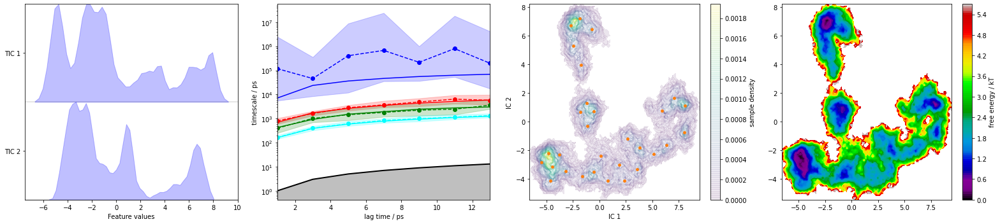

In [5]:
fig, axes = plt.subplots(1, 4, figsize=(22, 5))
pyemma.plots.plot_feature_histograms(pca_concatenated, feature_labels=['TIC 1', 'TIC 2'], ax=axes[0])
pyemma.plots.plot_implied_timescales(its, ax=axes[1], units='ps')
pyemma.plots.plot_density(*pca_concatenated.T, ax=axes[2], cbar=True, alpha=0.1)
pyemma.plots.plot_free_energy(*pca_concatenated.T, ax=axes[3], cbar=True)
axes[2].scatter(*clustert2.clustercenters.T, s=15, c='C1')
axes[2].set_xlabel('IC 1')
axes[2].set_ylabel('IC 2')
fig.tight_layout()

initialize kmeans++ centers:   0%|                                                                            …

kmeans iterations:   0%|                                                                                      …

estimating BayesianMSM:   0%|                                                                                 …

18-04-22 15:06:43 pyemma.msm.estimators.implied_timescales.ImpliedTimescales[8] WARNING  Changed user setting nits to the number of available timescales nits=3


initialize kmeans++ centers:   0%|                                                                            …

kmeans iterations:   0%|                                                                                      …

estimating BayesianMSM:   0%|                                                                                 …

initialize kmeans++ centers:   0%|                                                                            …

kmeans iterations:   0%|                                                                                      …

estimating BayesianMSM:   0%|                                                                                 …

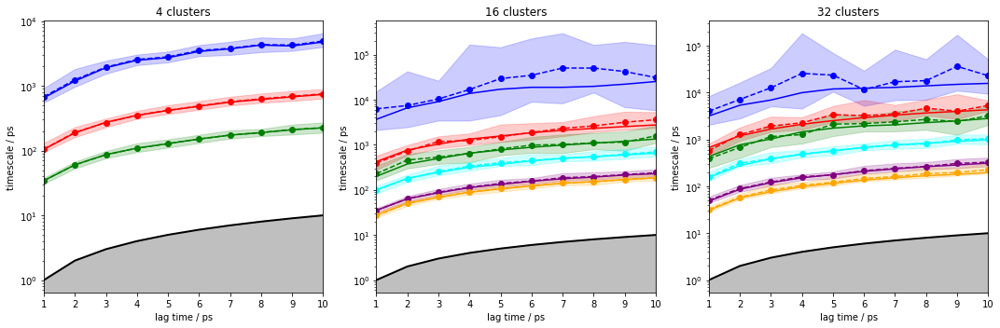

In [6]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, k in enumerate([4, 16, 32]):
    cluster6 = pyemma.coordinates.cluster_kmeans(pca_concatenated, k=k, max_iter=100, stride=1)
    pyemma.plots.plot_implied_timescales(
        pyemma.msm.its(cluster6.dtrajs, lags=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10], nits=6, errors='bayes'),
        ax=axes[i], units='ps')
    axes[i].set_title(str(k)+' clusters')
    
fig.tight_layout()

### Chapman-Kolmogorov Test

We next will construct the MSM proper, and we will test the validity of our model using the CK test. This test determines if the transition matrix (the discretized transfer operator) fulfills the Chapman-Kolmogorov equation. What we are testing is whether the $\tau$-fold application of the transfer operator is the same as evaluating the transition matrix at time $t\times\tau$. In other words, if $\mathbf{\mathcal{T}}$ is our transfer matrix, then:
\begin{equation}
\mathbf{\mathcal{T}}(t_{0})^{\tau}=\mathbf{\mathcal{T}}(t_{0}\times\tau)
\end{equation}
This equation helps us determine whether or not our MSM accurately describes our MD trajectory.

estimating MaximumLikelihoodMSM:   0%|                                                                        …

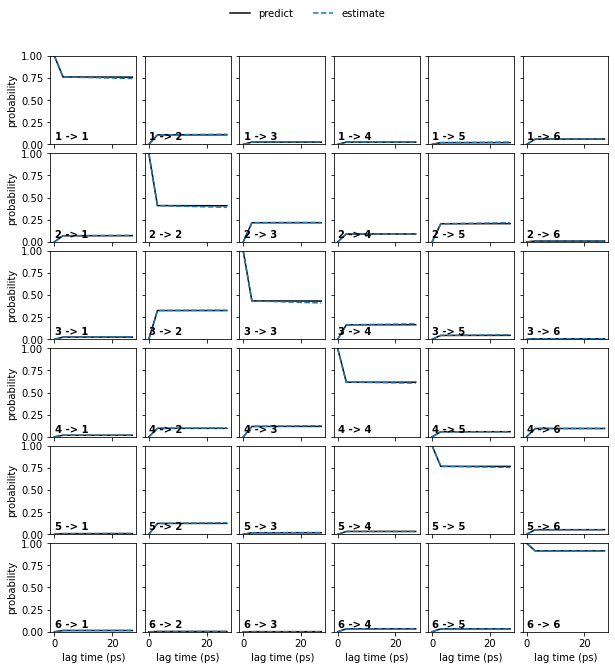

In [7]:
msm = pyemma.msm.estimate_markov_model(clustert2.dtrajs, lag=3, dt_traj='1 ps')
pyemma.plots.plot_cktest(msm.cktest(6), units='ps');
dtrajs_concatenated = np.concatenate(clustert2.dtrajs)


In [8]:
eigvec = msm.eigenvectors_right()
print('first eigenvector is one: {} (min={}, max={})'.format(
    np.allclose(eigvec[:, 0], 1, atol=1e-15), eigvec[:, 0].min(), eigvec[:, 0].max()))
# print(clustert2.clustercenters[:,2].T)


first eigenvector is one: True (min=0.999999999988881, max=1.0000000000185132)


### Eigenvalues and Eigenvectors

We will now compute the eigenvalues of our MSM, and use them to determine the slowest motional regiemes of our system using:
\begin{equation}
    u_{t+k\tau}(\mathbf{x})=1+\sum_{i=2}^{m}e^{\dfrac{-k\tau}{t_{i}}}\langle u_{i},\psi_{i}\rangle_{\mu}\psi_{i}(\mathbf{x})+\mathcal{T}_{fast}(k\tau)\circ u_{t}(\mathbf{x}).
\end{equation}

The first Eigenvalue is always 1, and corresponds to the stationary distribution (or equilibrium). Each smaller eigenvalue corresponds to a motional regieme with a timescale inversely corresponding to eigenvalue index. In other words, the second eigenvalue corresponds to the slowest key motion of the system, the third is slightly faster, the fourth is faster than that, and so on until we reach the eigenvalues that are not in the discrete (dominant) part of our spectrum where the motions are not resolved by our model (because they occur on too short of a timescale to be relevant.)

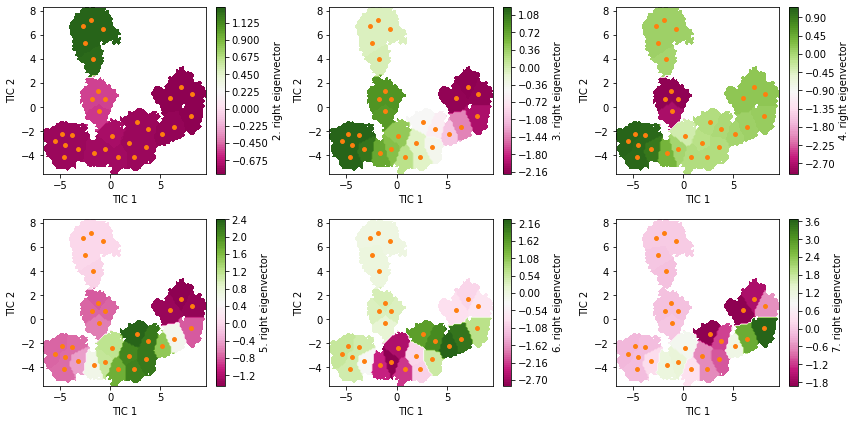

In [9]:
fig, axes = plt.subplots(2, 3, figsize=(12, 6))
for i, ax in enumerate(axes.flat):
    pyemma.plots.plot_contour(*pca_concatenated.T, eigvec[dtrajs_concatenated, i+1], ax=ax, cmap='PiYG',cbar_label='{}. right eigenvector'.format(i + 2), mask=True)
    ax.scatter(*clustert2.clustercenters.T, s=15, c='C1')
    ax.set_xlabel('TIC 1')
    ax.set_ylabel('TIC 2')
fig.tight_layout()

### Clustering Results

Displayed below is the result of the clustering of our data after PCA. The cluster centers are overlayed onto a probability density map of the distribution of states observed in our system.

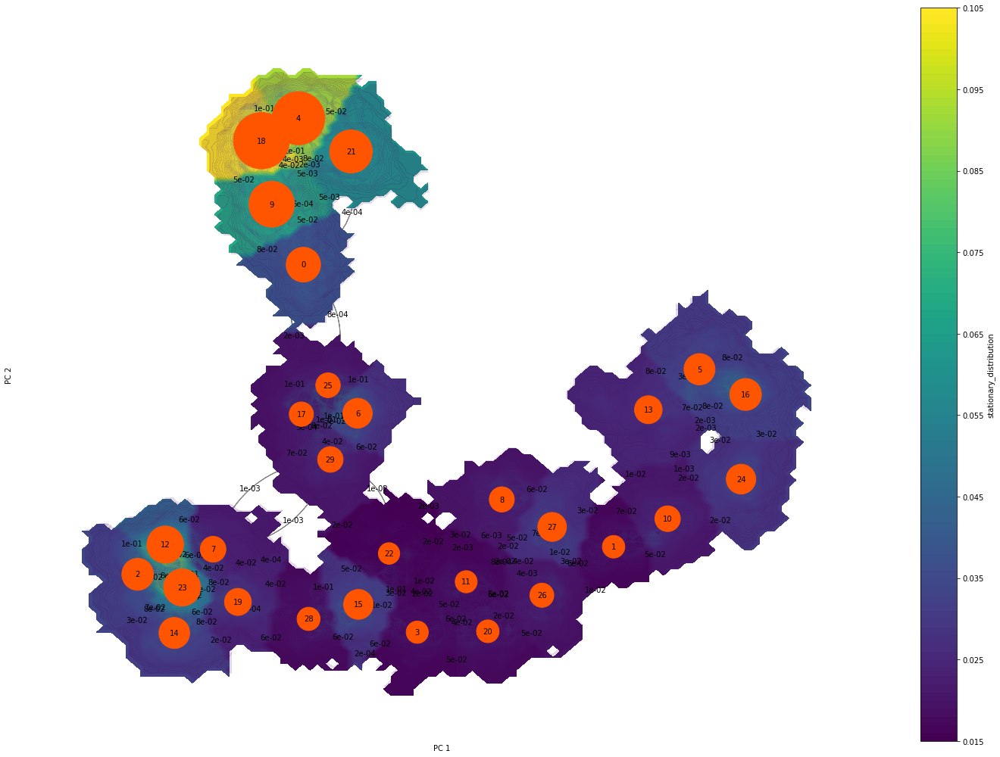

In [10]:
fig, ax = plt.subplots(1, 1, figsize=(20, 14))
_, _, misc = pyemma.plots.plot_contour(
# fig, ax, misc = pyemma.plots.plot_contour(
*pca_concatenated.T, msm.pi[dtrajs_concatenated],
cbar_label='stationary_distribution',
method='nearest', mask=True, ax=ax)
ax.scatter(*clustert2.clustercenters.T, s=15, c='C1')

pyemma.plots.plot_markov_model(msm, pos=clustert2.clustercenters, ax=ax)
pyemma.plots.plot_density(*pca_concatenated.T, ax=ax, cbar=False, alpha=0.15)

ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
# ax.set_xlim(-2*np.pi, 2*np.pi)
# ax.set_ylim(-2*np.pi, 2*np.pi)
fig.tight_layout()

### Second Estimation

Here we use another method, namely bayesian estimation, to construct our transition matrix and construct our MSM. As can be seen, the results are indistinguishable. 

pyemma.msm.estimators.bayesian_msm.BayesianMSM[21]: compute stat. inefficiencies:   0%|                       …

pyemma.msm.estimators.bayesian_msm.BayesianMSM[21]: Sampling MSMs:   0%|                                      …

estimating BayesianMSM:   0%|                                                                                 …

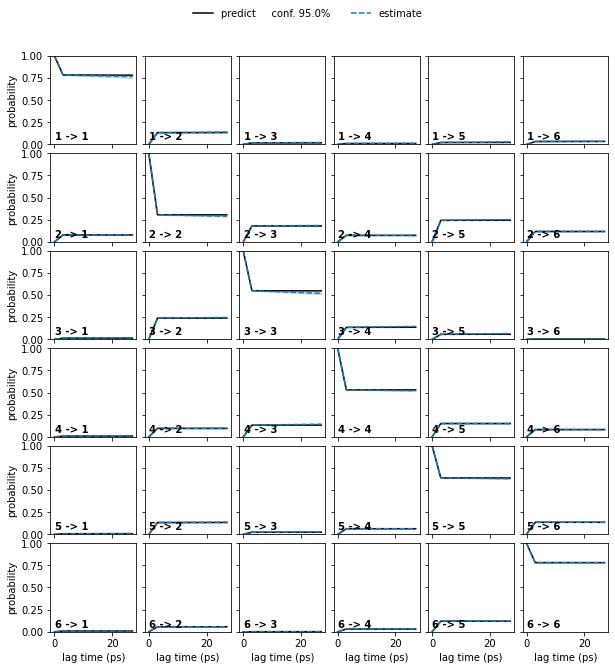

In [11]:
nstates = 6
bayesian_msm = pyemma.msm.bayesian_markov_model(clustert2.dtrajs, lag=3, dt_traj='1 ps')
pyemma.plots.plot_cktest(bayesian_msm.cktest(nstates), units='ps');

In [ ]:
# clustert2.save('MOR_Isoto.pyemma', model_name='Isoto_cluster', overwrite=True)
# msm.save('MOR_Isoto.pyemma', model_name='Isoto_msm', overwrite=True)
# bayesian_msm.save('MOR_Isoto.pyemma', model_name='Isoto_bayesian_msm', overwrite=True)

In [ ]:
# msm = pyemma.load('MOR_Isoto.pyemma', model_name='Isoto_msm')
# bayesian_msm = pyemma.load('MOR_Isoto.pyemma', model_name='Isoto_bayesian_msm')
# cluster = pyemma.load('MOR_Isoto.pyemma', model_name='Isoto_cluster')
# dtrajs_concatenated = np.concatenate(clustert2.dtrajs)

In [12]:
nstates = 6
msm.pcca(nstates)
for i, s in enumerate(msm.metastable_sets):
    print('π_{} = {:f}'.format(i + 1, msm.pi[s].sum()))

π_1 = 0.090840
π_2 = 0.112063
π_3 = 0.106419
π_4 = 0.120542
π_5 = 0.202440
π_6 = 0.367698


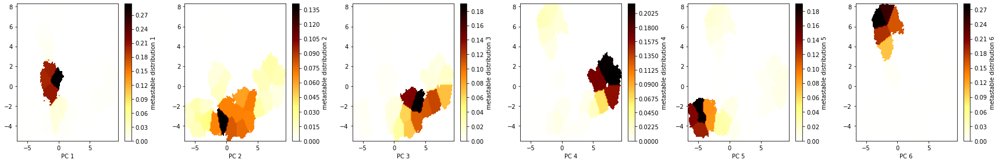

In [13]:
fig, axes = plt.subplots(1, 6, figsize=(24, 4))
for i, ax in enumerate(axes.flat):
    pyemma.plots.plot_contour(
        *pca_concatenated.T,
        msm.metastable_distributions[i][dtrajs_concatenated],
        ax=ax,
        cmap='afmhot_r', 
        mask=True,
        cbar_label='metastable distribution {}'.format(i + 1))
    ax.set_xlabel('PC '+str(i+1))
# axes[0].set_ylabel('PC 2')
fig.tight_layout()

In [14]:
metastable_traj = msm.metastable_assignments[dtrajs_concatenated]
highest_membership = msm.metastable_distributions.argmax(1)
coarse_state_centers = clustert2.clustercenters[msm.active_set[highest_membership]]

In [15]:
mfpt = np.zeros((nstates, nstates))
for i in range(nstates):
    for j in range(nstates):
        mfpt[i, j] = msm.mfpt(
            msm.metastable_sets[i],
            msm.metastable_sets[j])

inverse_mfpt = np.zeros_like(mfpt)
nz = mfpt.nonzero()
inverse_mfpt[nz] = 1.0 / mfpt[nz]

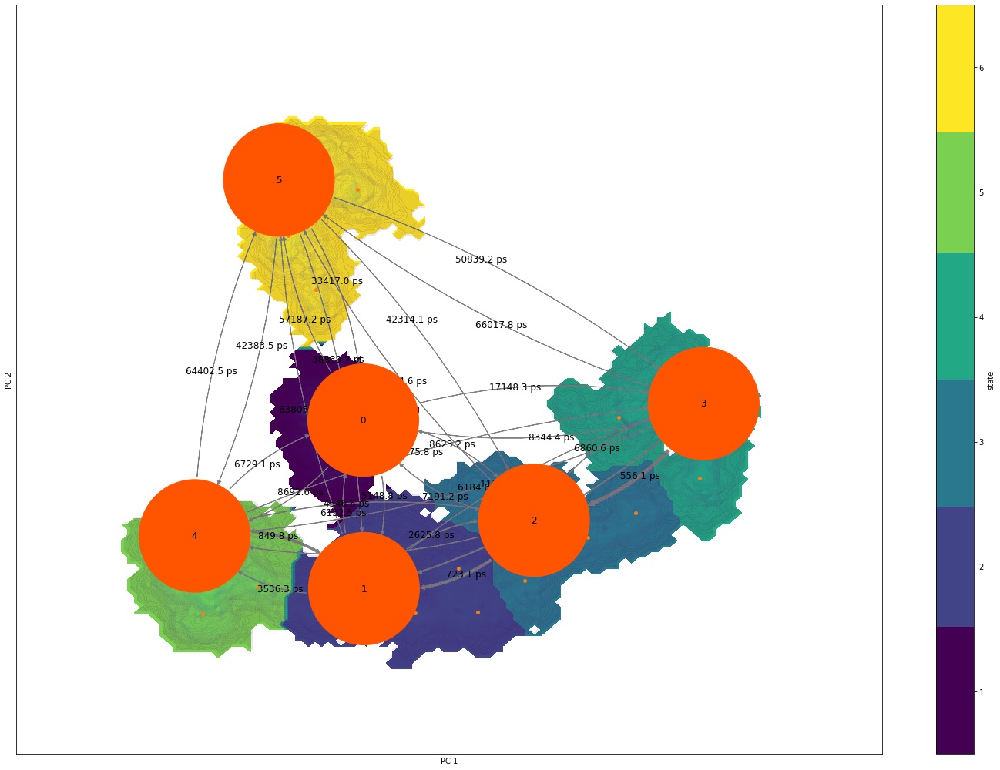

In [16]:
fig, ax = plt.subplots(figsize=(20, 14))
_, _, misc = pyemma.plots.plot_state_map(
    *pca_concatenated.T, metastable_traj, ax=ax, zorder=-1)
misc['cbar'].set_ticklabels(range(1, nstates + 1))  # set state numbers 1 ... nstates

pyemma.plots.plot_network(
    inverse_mfpt,
    pos=coarse_state_centers,
    figpadding=0.35,
    arrow_label_format='%.1f ps',
    arrow_labels=mfpt,
    size = 12,
    show_frame=True,
    ax=ax)

pyemma.plots.plot_density(*pca_concatenated.T, ax=ax, cbar=False, alpha=0.1)
ax.scatter(*clustert2.clustercenters.T, s=15, c='C1')

ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
# ax.set_xlim(-2*np.pi, 2*np.pi)
# ax.set_ylim(-2*np.pi, 2*np.pi)
fig.tight_layout()

In [17]:
def visualize_metastable(samples, cmap, selection='backbone'):
    """ visualize metastable states
    Parameters
    ----------
    samples: list of mdtraj.Trajectory objects
        each element contains all samples for one metastable state.
    cmap: matplotlib.colors.ListedColormap
        color map used to visualize metastable states before.
    selection: str
        which part of the molecule to selection for visualization. For details have a look here:
        http://mdtraj.org/latest/examples/atom-selection.html#Atom-Selection-Language
    """
    import nglview
    from matplotlib.colors import to_hex

    widget = nglview.NGLWidget()
    widget.clear_representations()
    ref = samples[0]
    for i, s in enumerate(samples):
        s = s.superpose(ref)
        s = s.atom_slice(s.top.select(selection))
        comp = widget.add_trajectory(s)
        comp.add_ball_and_stick()

    # this has to be done in a separate loop for whatever reason...
    x = np.linspace(0, 1, num=len(samples))
    for i, x_ in enumerate(x):
        c = to_hex(cmap(x_))
        widget.update_ball_and_stick(color=c, component=i, repr_index=i)
        # widget.remove_cartoon(component=i)
    return widget

In [26]:
print(files)

['/home/njm3/Desktop/069_MOR_emma_test.xtc', '/home/njm3/Desktop/p2_069_MOR_emma_test.xtc', '/home/njm3/Desktop/p2_069_MOR_emma_test_no2.xtc']


In [18]:
cmap = mpl.cm.get_cmap('viridis', nstates)

my_samples = [pyemma.coordinates.save_traj(files, idist, outfile=None, top=pdb)
              for idist in msm.sample_by_distributions(msm.metastable_distributions, 50)]

visualize_metastable(my_samples, cmap, selection='protein')

Obtaining file info:   0%|                                                                                    …

Obtaining file info:   0%|                                                                                    …

Obtaining file info:   0%|                                                                                    …

Obtaining file info:   0%|                                                                                    …

Obtaining file info:   0%|                                                                                    …

NGLWidget(max_frame=49)

In [57]:
import nglview
from matplotlib.colors import to_hex

selection2='protein'

# print(my_samples[1])
s=my_samples[5]
widget5 = nglview.NGLWidget()
linked_ngl_wd = nglview.NGLWidget()
p = TrajectoryPlayer(widget5)
s = s.atom_slice(s.top.select('protein'))
comp = widget5.add_trajectory(s)
# comp.add_ball_and_stick()
# linked_ngl_wd.add_ball_and_stick('PRO[224]')
widget5.add_representation(repr_type="licorice", selection='147')
widget5.add_representation(repr_type="licorice", selection='148')
widget5.add_representation(repr_type="licorice", selection='293')
widget5.add_representation(repr_type="licorice", selection='332')
widget5.add_representation(repr_type="licorice", selection='333')
widget5.add_representation(repr_type="hyperball", selection='151') ## M3.36
widget5.add_representation(repr_type="hyperball", selection='233') ## K5.39
widget5.add_representation(repr_type="hyperball", selection='296') ## I6.51
widget5.add_representation(repr_type="hyperball", selection='297') ## H6.52
widget5.add_representation(repr_type="hyperball", selection='300') ## V6.55
widget5.add_representation(repr_type="hyperball", selection='326') 
widget5.add_representation(repr_type="hyperball", selection='289')
widget5.add_representation(repr_type="hyperball", selection='237')
widget5.add_representation(repr_type="hyperball", selection='124')
widget5.add_representation(repr_type="hyperball", selection='127')
widget5.add_representation(repr_type="hyperball", selection='133')
widget5.add_representation(repr_type="hyperball", selection='143')
widget5.add_representation(repr_type="hyperball", selection='144')
widget5.add_representation(repr_type="hyperball", selection='216')
widget5.add_representation(repr_type="hyperball", selection='217')
widget5.add_representation(repr_type="hyperball", selection='229')
widget5.add_representation(repr_type="hyperball", selection='230')
widget5

NameError: name 'my_samples' is not defined

In [20]:
selection2='protein'

# print(my_samples[1])
s=my_samples[4]
widget5 = nglview.NGLWidget()
linked_ngl_wd = nglview.NGLWidget()
p = TrajectoryPlayer(widget5)
s = s.atom_slice(s.top.select('protein'))
comp = widget5.add_trajectory(s)
# comp.add_ball_and_stick()
# linked_ngl_wd.add_ball_and_stick('PRO[224]')
widget5.add_representation(repr_type="licorice", selection='147')
widget5.add_representation(repr_type="licorice", selection='148')
widget5.add_representation(repr_type="licorice", selection='293')
widget5.add_representation(repr_type="licorice", selection='332')
widget5.add_representation(repr_type="licorice", selection='333')
widget5.add_representation(repr_type="hyperball", selection='151') ## M3.36
widget5.add_representation(repr_type="hyperball", selection='233') ## K5.39
widget5.add_representation(repr_type="hyperball", selection='296') ## I6.51
widget5.add_representation(repr_type="hyperball", selection='297') ## H6.52
widget5.add_representation(repr_type="hyperball", selection='300') ## V6.55
widget5.add_representation(repr_type="hyperball", selection='326') 
widget5.add_representation(repr_type="hyperball", selection='289')
widget5.add_representation(repr_type="hyperball", selection='237')
widget5.add_representation(repr_type="hyperball", selection='124')
widget5.add_representation(repr_type="hyperball", selection='127')
widget5.add_representation(repr_type="hyperball", selection='133')
widget5.add_representation(repr_type="hyperball", selection='143')
widget5.add_representation(repr_type="hyperball", selection='144')
widget5.add_representation(repr_type="hyperball", selection='216')
widget5.add_representation(repr_type="hyperball", selection='217')
widget5.add_representation(repr_type="hyperball", selection='229')
widget5.add_representation(repr_type="hyperball", selection='230')
widget5

NGLWidget(max_frame=49)

In [21]:
import nglview
from matplotlib.colors import to_hex

selection2='protein'

# print(my_samples[1])
s=my_samples[0]
widget5 = nglview.NGLWidget()
p = TrajectoryPlayer(widget5)
s = s.atom_slice(s.top.select('protein'))
comp = widget5.add_trajectory(s)
# comp.add_ball_and_stick()
# widget5.add_ball_and_stick('PRO[224]')
widget5.add_representation(repr_type="licorice", selection='147')
widget5.add_representation(repr_type="licorice", selection='148')
widget5.add_representation(repr_type="licorice", selection='293')
widget5.add_representation(repr_type="licorice", selection='332')
widget5.add_representation(repr_type="licorice", selection='333')
widget5.add_representation(repr_type="hyperball", selection='151') ## M3.36
widget5.add_representation(repr_type="hyperball", selection='233') ## K5.39
widget5.add_representation(repr_type="hyperball", selection='296') ## I6.51
widget5.add_representation(repr_type="hyperball", selection='297') ## H6.52
widget5.add_representation(repr_type="hyperball", selection='300') ## V6.55
widget5.add_representation(repr_type="hyperball", selection='326') 
widget5.add_representation(repr_type="hyperball", selection='289')
widget5.add_representation(repr_type="hyperball", selection='237')
widget5.add_representation(repr_type="hyperball", selection='124')
widget5.add_representation(repr_type="hyperball", selection='127')
widget5.add_representation(repr_type="hyperball", selection='133')
widget5.add_representation(repr_type="hyperball", selection='143')
widget5.add_representation(repr_type="hyperball", selection='144')
widget5.add_representation(repr_type="hyperball", selection='216')
widget5.add_representation(repr_type="hyperball", selection='217')
widget5

NGLWidget(max_frame=49)

In [22]:
import nglview
from matplotlib.colors import to_hex

selection2='protein'

# print(my_samples[1])
s=my_samples[3]
widget5 = nglview.NGLWidget()
p = TrajectoryPlayer(widget5)
s = s.atom_slice(s.top.select('protein'))
comp = widget5.add_trajectory(s)
# comp.add_ball_and_stick()
# widget5.add_ball_and_stick('PRO[224]')
widget5.add_representation(repr_type="licorice", selection='147')
widget5.add_representation(repr_type="licorice", selection='148')
widget5.add_representation(repr_type="licorice", selection='293')
widget5.add_representation(repr_type="licorice", selection='332')
widget5.add_representation(repr_type="licorice", selection='333')
widget5.add_representation(repr_type="hyperball", selection='151') ## M3.36
widget5.add_representation(repr_type="hyperball", selection='233') ## K5.39
widget5.add_representation(repr_type="hyperball", selection='296') ## I6.51
widget5.add_representation(repr_type="hyperball", selection='297') ## H6.52
widget5.add_representation(repr_type="hyperball", selection='300') ## V6.55
widget5.add_representation(repr_type="hyperball", selection='326') 
widget5.add_representation(repr_type="hyperball", selection='289')
widget5.add_representation(repr_type="hyperball", selection='237')
widget5.add_representation(repr_type="hyperball", selection='124')
widget5.add_representation(repr_type="hyperball", selection='127')
widget5.add_representation(repr_type="hyperball", selection='133')
widget5.add_representation(repr_type="hyperball", selection='143')
widget5.add_representation(repr_type="hyperball", selection='144')
widget5.add_representation(repr_type="hyperball", selection='216')
widget5.add_representation(repr_type="hyperball", selection='217')
widget5

NGLWidget(max_frame=49)

In [26]:
A = msm.metastable_sets[3]
B = msm.metastable_sets[5]
flux = pyemma.msm.tpt(msm, A, B)
cg, cgflux = flux.coarse_grain(msm.metastable_sets)

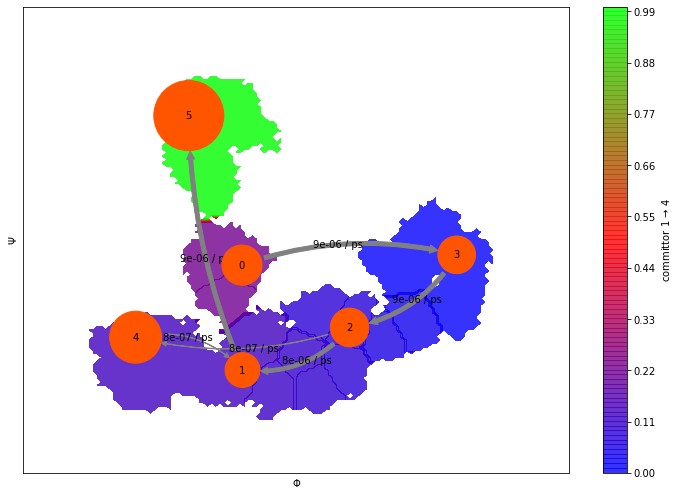

In [27]:
fig, ax = plt.subplots(figsize=(10, 7))

pyemma.plots.plot_contour(
    *pca_concatenated.T,
    flux.committor[dtrajs_concatenated],
    cmap='brg',
    ax=ax,
    mask=True,
    cbar_label=r'committor 1 $\to$ 4',
    alpha=0.8,
    zorder=-1);

pyemma.plots.plot_flux(
    cgflux,
    coarse_state_centers,
    cgflux.stationary_distribution,
    state_labels=['0','1' ,'2', '3','4','5'], 
    ax=ax,
    show_committor=False,
    figpadding=0.35,
    show_frame=True,
    arrow_label_format='%2.e / ps');

ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
# ax.set_xlim(-np.pi, np.pi)
# ax.set_ylim(-np.pi, np.pi)
fig.tight_layout()

In [28]:
paths, path_fluxes = cgflux.pathways(fraction=0.99)
print('percentage       \tpath')
print('-------------------------------------')
for i in range(len(paths)):
    print(np.round(path_fluxes[i] / np.sum(path_fluxes), 3),' \t', paths[i])

percentage       	path
-------------------------------------
0.906  	 [0 3 2 1 5]
0.094  	 [0 3 2 4 1 5]


In [29]:
print(files)

['/home/njm3/Desktop/069_MOR_emma_test.xtc', '/home/njm3/Desktop/p2_069_MOR_emma_test.xtc', '/home/njm3/Desktop/p2_069_MOR_emma_test_no2.xtc']


In [ ]:
# from scipy import stats
# mu = 1.01321
# sigma = 0.000762
# stats.norm.interval(0.68, loc=mu, scale=sigma)

# alpha = 0.05               # significance level = 5%
# n = 192              # sample sizes
# s2 = sigma   # sample variance
# df = n - 1                 # degrees of freedom

# upper = (n - 1) * s2 / stats.chi2.ppf(alpha / 2, df)
# lower = (n - 1) * s2 / stats.chi2.ppf(1 - alpha / 2, df)
# print(lower)
# print(upper)

In [30]:
MD_list = [molpx.generate._md.load(file, top=pdb)for file in files]

In [31]:
print(MD_list)
# print(clustert2)

[<mdtraj.Trajectory with 50001 frames, 4845 atoms, 295 residues, and unitcells at 0x7f7570f8dd00>, <mdtraj.Trajectory with 50001 frames, 4845 atoms, 295 residues, and unitcells at 0x7f7571162af0>, <mdtraj.Trajectory with 50001 frames, 4845 atoms, 295 residues, and unitcells at 0x7f7570478be0>]


In [32]:
data_sample, geoms = molpx.generate.sample(MD_list, pdb, clustert2, 
                                     n_geom_samples=50, 
                                     #keep_all_samples=True # read the doc for this argument
                                    )

In [ ]:
%matplotlib ipympl
from matplotlib import pylab as plt
proj_idxs = [0,112]
mpx_wdg_box = molpx.visualize.FES(MD_list,
                                  pdb,
                                  data_torsions,
                                  nbins=50,
                                  #proj_idxs=proj_idxs,
                                  #proj_labels=feat,
                                  proj_labels='feat',
                                  #n_overlays=5,
                                  #sticky=True,
                                 )
__ = molpx.visualize.feature(feat2.active_features[0],
                             mpx_wdg_box.linked_ngl_wdgs[0],
                             idxs=proj_idxs, radius=.5,
                             color_list=['red','green'])

mpx_wdg_box.display()




In [ ]:
dt = 244
mpx_wdg_box = molpx.visualize.traj(MD_list,     
                                  pdb,                                                                                                                              
                                  data_torsions,
                                  #Y_filenames,                                          
                                  plot_FES = True,                                        
                                  dt = dt*1e-6, tunits='ms',    
                                  #traj_selection = 0,
                                  #sharey_traj=False,
                                  #max_frames=100,
                                #   proj_idxs=[0],                                           
                                  panel_height=1,
                                  projection=pca, ## this is what's new
                                  n_feats=2
                                 )
                          
mpx_wdg_box

In [ ]:
plt.figure(figsize=(4,4))

ax, pos  = pyemma.plots.plot_markov_model(msm.P, 
                                          minflux=5e-4, 
                                          arrow_labels=None,
                                          ax=plt.gca(), 
                                          arrow_curvature = 2, show_frame=True,
                                          pos=clustert2.clustercenters)
# Add a background if wanted
h, (x, y) = np.histogramdd(np.vstack(pca_concatenated)[:,:2], weights=np.hstack(msm.trajectory_weights()),  bins=50)
plt.contourf(x[:-1], y[:-1], -np.log(h.T), cmap="jet", alpha=.5, zorder=0)
plt.xlim(x[[0,-1]])
plt.xticks(np.unique(x.round()))
plt.yticks(np.unique(y.round()))

plt.ylim(y[[0,-1]])

linked_ngl_wd, linked_ax_wd = molpx.visualize.sample(pos, geoms, plt.gca(), dot_color='blue')
linked_ngl_wd.add_representation(repr_type="licorice", selection='147')
linked_ngl_wd.add_representation(repr_type="licorice", selection='148')
linked_ngl_wd.add_representation(repr_type="licorice", selection='293')
linked_ngl_wd.add_representation(repr_type="licorice", selection='332')
linked_ngl_wd.add_representation(repr_type="licorice", selection='333')
linked_ngl_wd.add_representation(repr_type="hyperball", selection='151') ## M3.36
linked_ngl_wd.add_representation(repr_type="hyperball", selection='233') ## K5.39
linked_ngl_wd.add_representation(repr_type="hyperball", selection='296') ## I6.51
linked_ngl_wd.add_representation(repr_type="hyperball", selection='297') ## H6.52
linked_ngl_wd.add_representation(repr_type="hyperball", selection='300') ## V6.55
linked_ngl_wd.add_representation(repr_type="hyperball", selection='326') 
linked_ngl_wd.add_representation(repr_type="hyperball", selection='289')
linked_ngl_wd.add_representation(repr_type="hyperball", selection='237')
linked_ngl_wd.add_representation(repr_type="hyperball", selection='336')
linked_ngl_wd.add_representation(repr_type="hyperball", selection='244')
linked_ngl_wd.add_representation(repr_type="hyperball", selection='155')
linked_ngl_wd



In [ ]:
iwd = None
corr, ngl_wdg = molpx.visualize.correlations(pca,
                                          n_feats=3,
                                          proj_idxs=[0,1],
                                          geoms=MD_list[0][::100],
                                          #verbose=True,
                                          #proj_color_list=['red', 'blue', 'green'],
                                          widget=iwd
                                         )
ngl_wdg

In [ ]:
# mpx_widget_box = molpx.visualize.FES(MD_list,
#                                      pdb,
#                                      Y,
#                                      #proj_idxs=[1],
#                                      nbins=50,
#                                      proj_labels=['$\phi$',
#                                                   '$\psi$'],
#                                      atom_selection="symbol != H",
#                                      #n_overlays=5,
#                                      #sticky=True,
#                                      #color_list='random'
#                                     )
# mpx_widget_box

In [ ]:
pos, geom = molpx.generate.sample(MD_list, pdb, clustert2)

In [ ]:
msm.pcca(3)
dens_max_i = [distro.argmax() for distro in msm.metastable_distributions]
A = np.argmax([msm.stationary_distribution[iset].sum() for iset in msm.metastable_sets])
B = np.argmin([msm.stationary_distribution[iset].sum() for iset in msm.metastable_sets])
print(clustert2.clustercenters[dens_max_i[A]],
      clustert2.clustercenters[dens_max_i[B]])

In [ ]:
tpt = pyemma.msm.tpt(msm, [dens_max_i[A]], [dens_max_i[B]])
paths, flux = tpt.pathways(fraction=.5)

In [ ]:
# Get a path with a decent number of intermediates
sample_path = paths[np.argmax([len(ipath) for ipath in paths])]

In [ ]:
pyl.figure()
pyl.contourf(x[:-1], y[:-1], -np.log(h.T), cmap="jet", alpha=.5, zorder=0)
linked_ngl_wdg, linked_ax_wdg = molpx.visualize.sample(clustert2.clustercenters[sample_path],
                       geom[sample_path].superpose(geom[sample_path[0]]), pyl.gca(),
                       plot_path=True,
                      )
pyl.scatter(*clustert2.clustercenters.T, alpha=.25)
linked_ngl_wdg.add_representation(repr_type="licorice", selection='293')
linked_ngl_wdg

In [ ]:
from graphein.protein.config import ProteinGraphConfig, DSSPConfig
from graphein.protein.graphs import construct_graph
from graphein.protein.edges.distance import (
    add_aromatic_interactions,
    add_disulfide_interactions,
    add_hydrophobic_interactions,
    add_peptide_bonds,
)
from graphein.protein.features.nodes import asa, rsa

from graphein.protein.edges.distance import add_hydrogen_bond_interactions, add_ionic_interactions


In [ ]:
config = ProteinGraphConfig()
simple_graph = construct_graph(config, pdb_path='/home/njm3/Desktop/069_MOR_emma_test_short_edit2.pdb')

In [ ]:
edge_funcs = [add_hydrogen_bond_interactions, add_ionic_interactions, add_peptide_bonds]
config = ProteinGraphConfig(edge_construction_functions= edge_funcs)
complex_graph = construct_graph(config, pdb_path='/home/njm3/Desktop/069_MOR_emma_test_short_edit2.pdb')

In [ ]:
from graphein.protein.visualisation import plot_distance_matrix

plot_distance_matrix(complex_graph)


In [ ]:
contact_map = (simple_graph.graph["dist_mat"] > 10).astype(int) # Threshold distance matrix
plot_distance_matrix(g=simple_graph, dist_mat=contact_map) 

In [ ]:
from graphein.protein.visualisation import plot_distance_landscape

plot_distance_landscape(complex_graph)


In [ ]:
from graphein.protein.analysis import graph_summary

graph_summary(complex_graph)


In [ ]:
# from ipymol import viewer as ipymol
# ipymol.start()


In [3]:
import MDAnalysis as mda
import MDAnalysis.analysis.pca as pca
from MDAnalysis.coordinates.base import Timestep


import os
import glob

import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.cm
import matplotlib.ticker as ticker

ValueError: numpy.ndarray size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject